# Business Understanding

# Load Data

In [52]:
#data has been saved using a .pkl file. 
path = './data/df_for_model.pkl'
df = pd.read_pickle(path)
df.head(2)

,power_mw_obsnorm,power_available_mw_obsnorm,target_losses_norm,dswrf_sfc_wm2,gust_sfc_ms,hpbl_sfc_m,msl_ms_pa,pottemp_80mto0m_K,q_2m_1,q_pfg30_1,r_pl925_perc,r_pl950_perc,shtfl_sfc_wm2,t_100m_k,t_2m_k,t_pfg30_k,tcclow_sfc_perc,tccmedium_sfc_perc,wdir_100m_dn,wdir_10m_dn,wdir_pfg30_dn,wdir_pl925_dn,wsp_100m_ms,wsp_10m_ms,wsp_pfg30_ms,wsp_pl925_ms,azimuth,elevation,Date,year,month,day,hour,minute,weekday,working_day,summer
2018-01-01 06:00:00,0.486251,0.911849,0.425598,0.0,16.777032,1349.927656,99212.062500,0.559356,0.005105,0.004852,89.975000,83.0750,-58.444885,280.079346,280.496348,279.811816,99.375000,49.500000,54.455224,51.936818,54.855777,58.963042,16.548291,9.772748,16.622077,21.963719,111.880959,-12.132894,2018-01-01,2018,1,1,6,0,Monday,False,0
2018-01-01 06:10:00,0.528225,0.932739,0.404513,0.0,16.748651,1350.376965,99220.020833,0.554256,0.005088,0.004833,89.854167,82.9375,-58.558706,280.057788,280.470277,279.787207,99.354167,54.458333,55.784078,53.253883,56.181451,60.237190,16.589409,9.804977,16.657162,21.955989,113.717751,-10.743970,2018-01-01,2018,1,1,6,10,Monday,False,0


# Modeling

## General Functions

### Error Metrics Function (RMSE, R2, MAE, MAPE)

In [53]:
def error_metrics(y_pred, y_truth):
    """
    Calculate error metrics for a single comparison between predicted and observed values
    or the mean error metrics of multiple comparisons (inputs should be lists)
    """
    
    if isinstance(y_pred, list):
        RMSE = []
        R2 = []
        MAE = []
        MAPE = []
        for i in range(len(y_pred)):
            RMSE.append(np.sqrt(mean_squared_error(y_truth[i], y_pred[i])))
            R2.append(r2_score(y_truth[i], y_pred[i]))
            MAE.append(mean_absolute_error(y_truth[i], y_pred[i]))
            MAPE.append((np.mean(np.abs((y_truth[i] - y_pred[i]) / y_truth[i])) * 100))
        
        RMSE_return = np.mean(RMSE)
        R2_return = np.mean(R2)
        MAE_return = np.mean(MAE)
        MAPE_return = np.mean(MAPE)
    
    else:
        RMSE_return = np.sqrt(mean_squared_error(y_truth, y_pred))
        R2_return = r2_score(y_truth, y_pred)
        MAE_return = mean_absolute_error(y_truth, y_pred)
        MAPE_return = (np.mean(np.abs((y_truth - y_pred) / y_truth)) * 100)
                   
    print('\nError metrics for naive model')
    print("RMSE or Root mean squared error: %.2f" % RMSE_return)
    print('R2-Score: %.2f' % R2_return )
    print('Mean Absolute Error: %.2f' % MAE_return)
    print('Mean Absolute Percentage Error: %.2f %%' % MAPE_return)
    
    name_error = ['RMSE', 'R2', 'MAE', 'MAPE']
    value_error = [RMSE_return, R2_return, MAE_return, MAPE_return/100]
    dict_error = dict()
    
    for i in range(len(name_error)):
        dict_error[name_error[i]] = [value_error[i]]
    return(dict_error)

### Residual plot (prediction vs observation)

In [54]:
def plot_predvstrue_reg(pred, truth, model_name=None):
    """
    Plots the observed target_loss against the predicted target_loss
    """
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    ax.scatter(truth, pred) 
    _ = plt.xlabel("Observed target_loss")
    _ = plt.ylabel("Predicted target_loss")
    _ = plt.title("Observed vs Predicted target_loss using model {}".format(model_name))
    _ = plt.xlim(1000, 5000)
    _ = plt.ylim(1000, 5000)
    #plotting 45 deg line to see how the prediction differs from the observed values
    x = np.linspace(*ax.get_xlim())
    _ = ax.plot(x, x)

### Plotting the true time series and the predicted time series in plotly interactive plot

In [55]:
def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity = 0.5, pred_ts_opacity = 0.5):
    """
    Plot plotly time series of the original (og_ts) and predicted (pred_ts) time series values to check how our model performs.
    model_name: name of the model used for predictions
    og_ts_opacity: opacity of the original time series
    pred_ts_opacity: opacity of the predicted time series
    """
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = og_ts.index, y = np.array(og_ts.values), name = "Observed",
                         line_color = 'deepskyblue', opacity = og_ts_opacity))

    try:
        fig.add_trace(go.Scatter(x = pred_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))
    except: #if predicted values are a numpy array they won't have an index
        fig.add_trace(go.Scatter(x = og_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))


    #fig.add_trace(go)
    fig.update_layout(title_text = 'Observed target_loss vs predicted target_loss values using {}'.format(model_name),
                  xaxis_rangeslider_visible = True)
    fig.show()

### Train-Test split that respects temporal order of observations

In [56]:
def train_test(data, test_size = 0.15):
    """
        Perform train-test split with respect to time series structure
        - df: dataframe with variables X_n to train on and the dependent output y which is the column 'target_losses_norm' in this notebook
        - test_size: size of test set 
    """
    df = data.copy()
    # get the index after which test set starts
    test_index = int(len(df)*(1-test_size))
    
    X_train = df.drop('target_losses_norm', axis = 1).iloc[:test_index]
    y_train = df.target_losses_norm.iloc[:test_index]
    X_test = df.drop('target_losses_norm', axis = 1).iloc[test_index:]
    y_test = df.target_losses_norm.iloc[test_index:]
    print('Observations: %d' % (len(df)))
    print('Training Observations: %d' % (len(X_train)))
    print('Testing Observations: %d' % (len(X_test)))
        
    return X_train, X_test, y_train, y_test

### Multiple Train-Test splits that respect temporal order of observations

In [57]:
from sklearn.model_selection import TimeSeriesSplit

def mul_train_test(data, n_splits=3):
    """
        Perform multiple train-test splits with respect to time series structure
        
        - df: dataframe with variables X_n to train on and the dependent output y which is the column 'target_losses_norm' in this notebook
        - n_splits: number of splits  
    """
    #creating copy of input data
    df = data.copy().reset_index(drop = True)
    
    #initializing TimeSeriesSplit with chosen number of splits
    splits = TimeSeriesSplit(n_splits)
    
    #separating label from features
    X = df.drop('target_losses_norm', axis = 1)
    y = df.target_losses_norm
    
    #initializing empty lists for X_train, X_test, y_train and y_test
    mul_X_train = []
    mul_X_test = []
    mul_y_train = []
    mul_y_test = []

    #creating multiple splits and storing them in a list
    for train_index, test_index in splits.split(df):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        print('Observations: %d' % (len(df)))
        print('Training Observations: %d' % (len(X_train)))
        print('Testing Observations: %d' % (len(X_test)))
        mul_X_train.append(X_train)
        mul_y_train.append(y_train)
        mul_X_test.append(X_test)
        mul_y_test.append(y_test)
    
    return mul_X_train, mul_X_test, mul_y_train, mul_y_test



## Naive Base Model

First a naive base model is implemented. This model always predicts the last seen value as the next.

In [58]:
naive = df[["target_losses_norm"]].copy(deep= True)
naive["predicted"] = naive["target_losses_norm"].shift(1)
naive = naive.dropna()
naive.head()

,target_losses_norm,predicted
2018-01-01 06:10:00,0.404513,0.425598
2018-01-01 06:20:00,0.405137,0.404513
2018-01-01 06:30:00,0.481961,0.405137
2018-01-01 06:40:00,0.497063,0.481961
2018-01-01 06:50:00,0.477600,0.497063


In [59]:
error_metrics(naive["predicted"], naive["target_losses_norm"])


Error metrics for naive model
RMSE or Root mean squared error: 0.01
R2-Score: 0.99
Mean Absolute Error: 0.00
Mean Absolute Percentage Error: 15.39 %


{'RMSE': [0.010709702085632726],
 'R2': [0.9923518145729044],
 'MAE': [0.004474374660219666],
 'MAPE': [0.15390826754834272]}

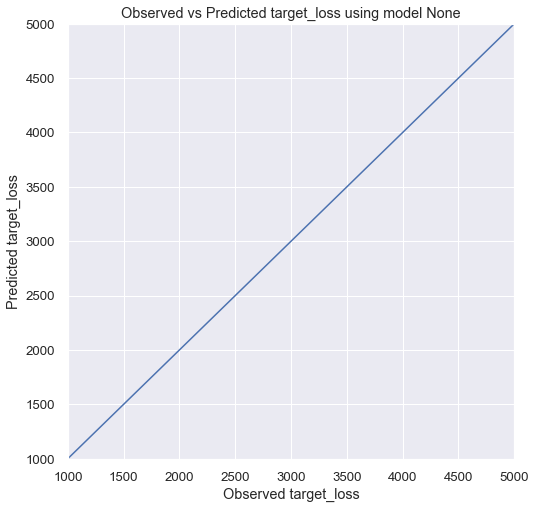

In [60]:
plot_predvstrue_reg(naive["predicted"],naive["target_losses_norm"])

In [61]:
plot_ts_pred(naive["target_losses_norm"], naive["predicted"], model_name="Naive Base Model", og_ts_opacity = 0.5, pred_ts_opacity = 0.5)